In [1]:
%load_ext autoreload
%autoreload 2

from substrata import *

plot = initializer.ProjectInitializer(path='/mnt/int_data/solomons_focal/sol_re3/sol_re3_60m/sol_re3_60m_20250708')
plot.initialize()

/home/pbongaerts/miniconda3/envs/substrata/lib/python3.10/site-packages/tqdm_joblib/__init__.py:4: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from tqdm.autonotebook import tqdm


Loading pointcloud from /mnt/int_data/solomons_focal/sol_re3/sol_re3_60m/sol_re3_60m_20250708/sol_re3_60m_20250708_dec50M.ply
Loading cameras from /mnt/int_data/solomons_focal/sol_re3/sol_re3_60m/sol_re3_60m_20250708/sol_re3_60m_20250708.meta.json and /mnt/int_data/solomons_focal/sol_re3/sol_re3_60m/sol_re3_60m_20250708/sol_re3_60m_20250708.cams.xml
Loading markers from /mnt/int_data/solomons_focal/sol_re3/sol_re3_60m/sol_re3_60m_20250708/sol_re3_60m_20250708_markers.csv


Optimal box contains 40424980 out of 49999964 points
Box coordinates:  [[4.899999999999999, 1.8000000000000023], [29.9, 5.8000000000000025]]


100%|██████████| 100/100 [00:21<00:00,  4.69it/s]


Intercept points found: 100/100
Extrapolated points with no match: 18


Getting first image matches: 100%|██████████| 100/100 [00:27<00:00,  3.65it/s]


{0: <substrata.cameras.ImageMatch at 0x7cb0daa05b40>,
 1: <substrata.cameras.ImageMatch at 0x7cb0db6b3790>,
 2: <substrata.cameras.ImageMatch at 0x7cb0daa06260>,
 3: <substrata.cameras.ImageMatch at 0x7cb0daa06020>,
 4: <substrata.cameras.ImageMatch at 0x7cb0daa05fc0>,
 5: <substrata.cameras.ImageMatch at 0x7cb0daa05f30>,
 6: <substrata.cameras.ImageMatch at 0x7cb0daa05db0>,
 7: <substrata.cameras.ImageMatch at 0x7cb0daa05bd0>,
 8: <substrata.cameras.ImageMatch at 0x7cb0daa05f90>,
 9: <substrata.cameras.ImageMatch at 0x7cb0daa05e40>,
 10: <substrata.cameras.ImageMatch at 0x7cb0daa06080>,
 11: <substrata.cameras.ImageMatch at 0x7cb0daa06200>,
 12: <substrata.cameras.ImageMatch at 0x7cb0daa05de0>,
 13: <substrata.cameras.ImageMatch at 0x7cb0daa06230>,
 14: <substrata.cameras.ImageMatch at 0x7cb0daa05c30>,
 15: <substrata.cameras.ImageMatch at 0x7cb0daa05ba0>,
 16: <substrata.cameras.ImageMatch at 0x7cb0daa05e10>,
 17: <substrata.cameras.ImageMatch at 0x7cb0daa05f00>,
 18: <substrata.came

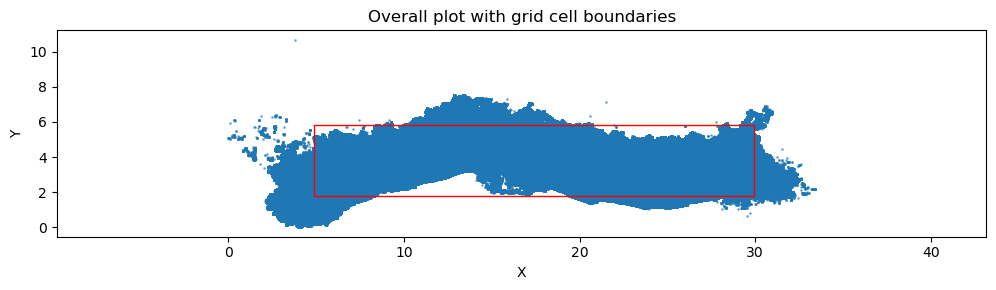

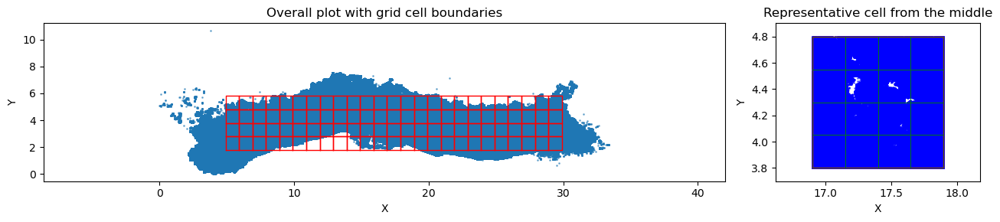

In [3]:
optimal_bbox = measurements.find_optimal_box_position(plot.pcd, box_length=25, box_width=4,
                                                step_size=0.1)
bboxes = measurements.subdivide_boxes(optimal_bbox, 1.0)
fig = visualizations.show_grid_cells(plot.pcd, bboxes)
fig.savefig("classified_intercepts_grid.png")

random_points = measurements.generate_random_xy_points_within_cells(bboxes, 1, 0)
intercepts = plot.pcd.get_z_intercepts(random_points, 0.005, always_return=True, store_neighboring_coords=True)
intercepts.get_original_coords(plot.world_transform)   # critical for get_first_image_matches 
intercepts.get_first_image_matches(plot.cams, plot.pcd)

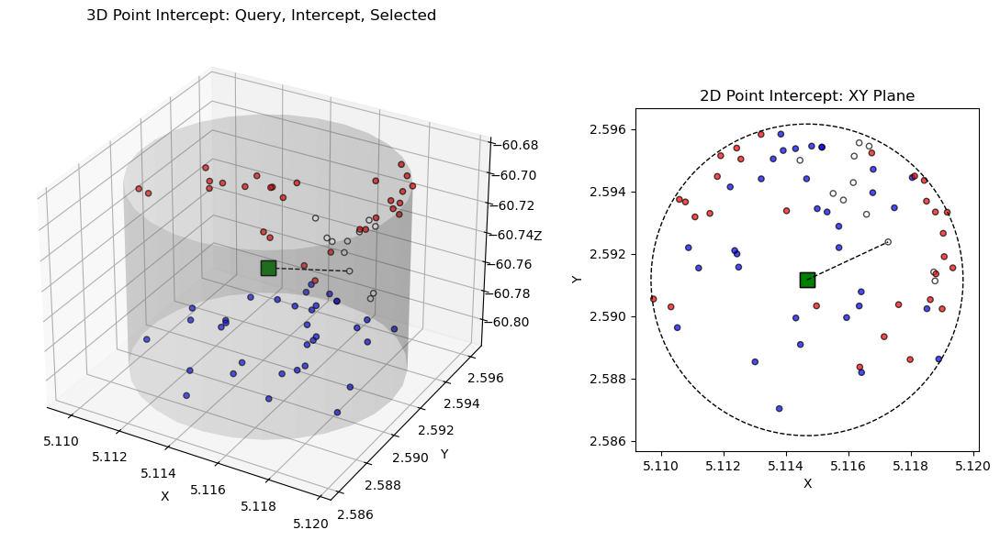

Image match for camera 31 at 6027, 2477
Depth: 4.240927868332168, Relevance: 0.0010664324716295182
Obstructed: False
Reprojection error: 0.00227298744295198
Reprojection coords: [  5.11658884   2.5932714  -60.74205224]


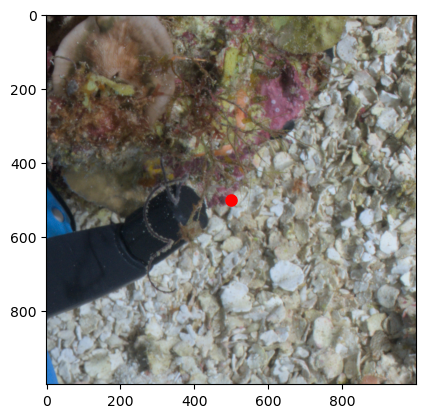

IndexError: list index out of range

In [10]:
for intercept in intercepts.subset(5):
    visualizations.show_intercept_point(intercept)
    intercept.image_matches[0].show()
    intercept.image_matches[1].show()


Getting first image matches: 100%|██████████| 11/11 [00:01<00:00,  8.96it/s]


Image match for camera 391 at 4178, 3567
Depth: 7.166343659441309, Relevance: 0.0013854899914597814
Obstructed: False
Reprojection error: 0.0016838432944242014
Reprojection coords: [  4.56762522   0.86483716 -62.43564603]


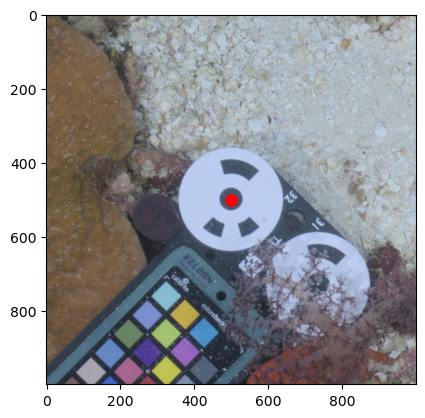

Image match for camera 390 at 3007, 3280
Depth: 6.710532134360708, Relevance: 0.0024400025188694176
Obstructed: False
Reprojection error: 0.002551674706064206
Reprojection coords: [  4.6697199    0.68679548 -62.48289091]


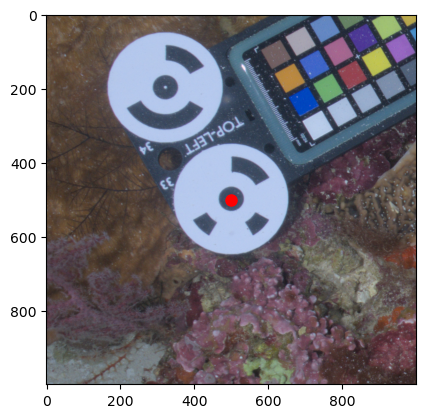

Image match for camera 390 at 2829, 2979
Depth: 6.703420678535309, Relevance: 0.0028559222166257203
Obstructed: False
Reprojection error: 0.0019628362127750375
Reprojection coords: [  4.59946004   0.67512262 -62.48684294]


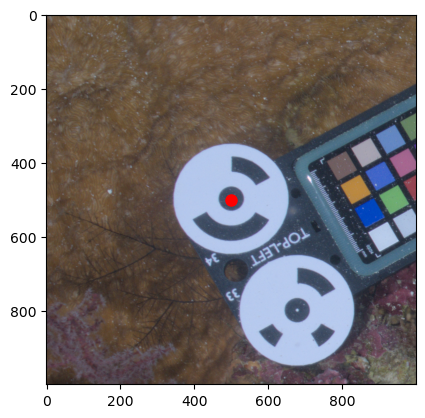

In [7]:
plot.markers.get_first_image_matches(plot.cams, plot.pcd)
for marker in plot.markers.subset(3):
    marker.image_match.show()

/home/pbongaerts/miniconda3/envs/substrata/lib/python3.10/site-packages/fastai/learner.py:455: UserWarning: load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.
If you only need to load model weights and optimizer state, use the safe `Learner.load` instead.
  warn("load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.\nIf you only need to load model weights and optimizer state, use the safe `Learner.load` instead.")
Classifying image matches:   0%|          | 0/100 [00:00<?, ?it/s]

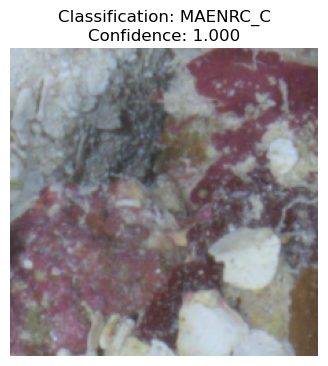

Classifying image matches:   1%|          | 1/100 [00:01<02:46,  1.68s/it]

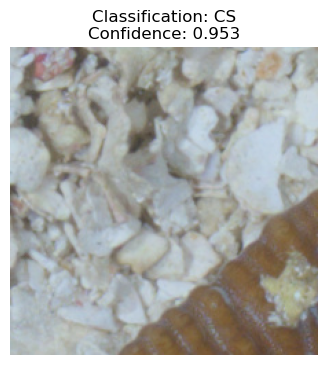

Classifying image matches:   2%|▏         | 2/100 [00:02<02:18,  1.41s/it]

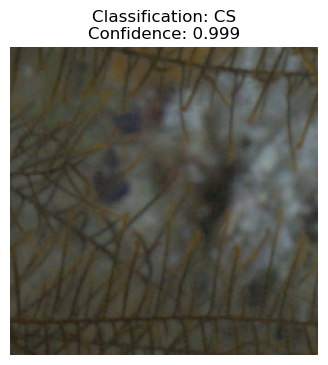

Classifying image matches:   3%|▎         | 3/100 [00:04<02:09,  1.33s/it]

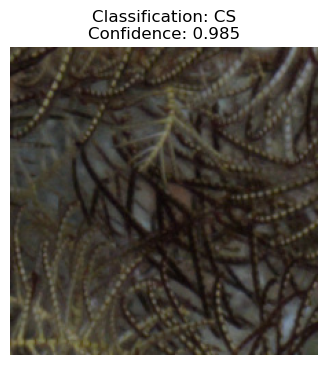

Classifying image matches:   4%|▍         | 4/100 [00:05<01:54,  1.19s/it]

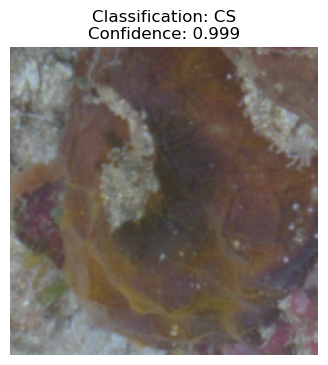

Classifying image matches:   5%|▌         | 5/100 [00:06<01:43,  1.09s/it]

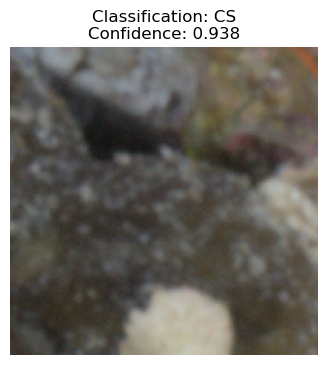

Classifying image matches:   6%|▌         | 6/100 [00:06<01:36,  1.03s/it]

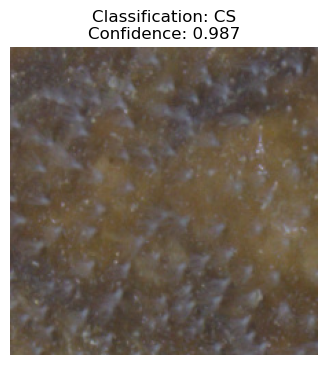

Classifying image matches:   7%|▋         | 7/100 [00:07<01:32,  1.01it/s]

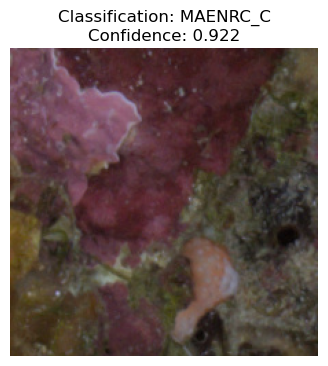

Classifying image matches:   8%|▊         | 8/100 [00:09<01:48,  1.18s/it]

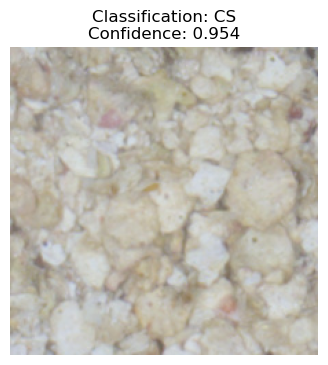

Classifying image matches:   9%|▉         | 9/100 [00:11<02:02,  1.34s/it]

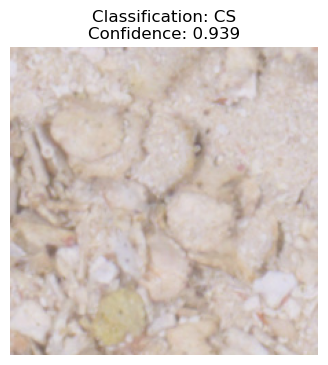

Classifying image matches:  10%|█         | 10/100 [00:12<01:52,  1.25s/it]

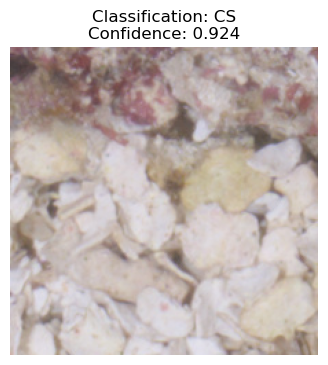

Classifying image matches:  11%|█         | 11/100 [00:13<02:00,  1.35s/it]

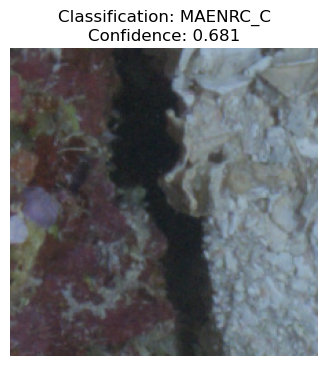

Classifying image matches:  12%|█▏        | 12/100 [00:14<01:47,  1.22s/it]

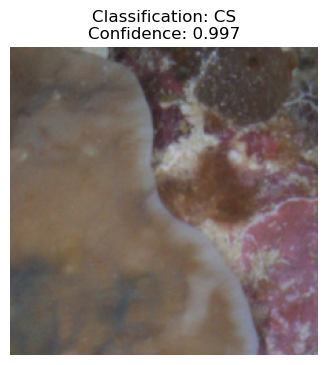

Classifying image matches:  13%|█▎        | 13/100 [00:15<01:37,  1.12s/it]

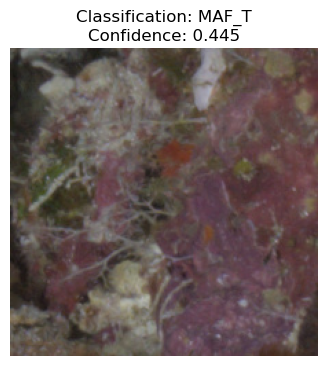

Classifying image matches:  14%|█▍        | 14/100 [00:16<01:33,  1.08s/it]

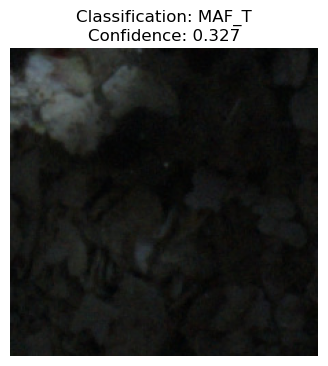

Classifying image matches:  15%|█▌        | 15/100 [00:17<01:37,  1.15s/it]

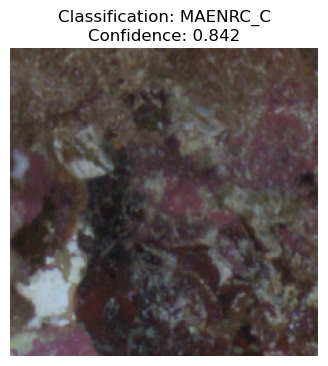

Classifying image matches:  16%|█▌        | 16/100 [00:19<01:36,  1.15s/it]

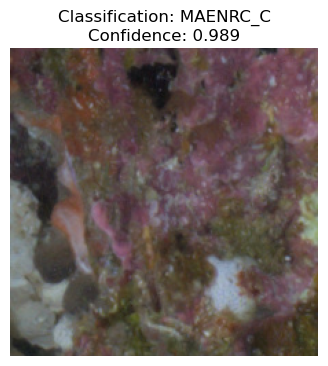

Classifying image matches:  18%|█▊        | 18/100 [00:20<01:14,  1.10it/s]

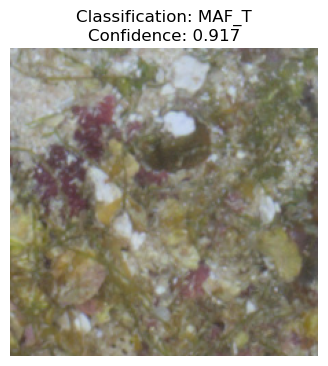

Classifying image matches:  19%|█▉        | 19/100 [00:21<01:20,  1.01it/s]

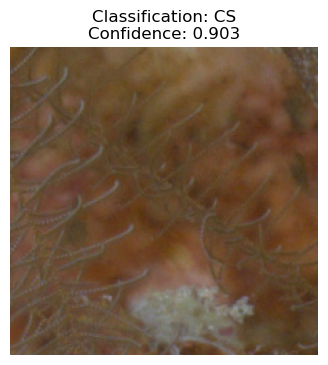

Classifying image matches:  20%|██        | 20/100 [00:22<01:24,  1.06s/it]

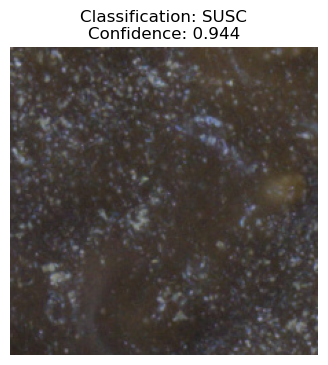

Classifying image matches:  21%|██        | 21/100 [00:23<01:22,  1.04s/it]

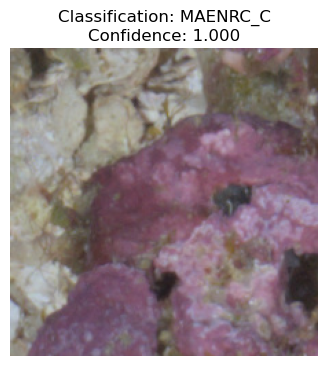

Classifying image matches:  22%|██▏       | 22/100 [00:24<01:15,  1.03it/s]

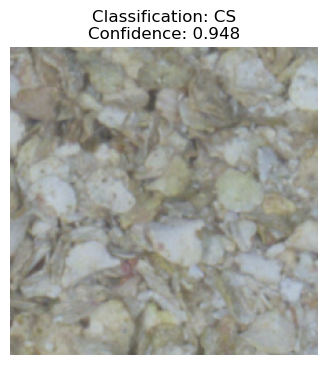

Classifying image matches:  23%|██▎       | 23/100 [00:25<01:14,  1.04it/s]

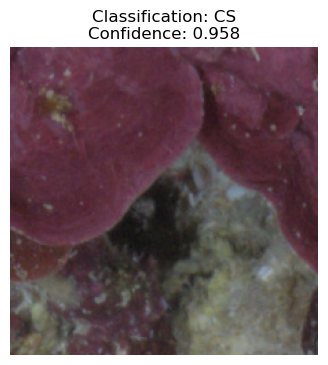

Classifying image matches:  24%|██▍       | 24/100 [00:26<01:12,  1.06it/s]

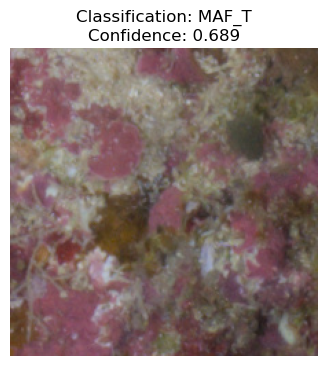

Classifying image matches:  25%|██▌       | 25/100 [00:27<01:11,  1.04it/s]

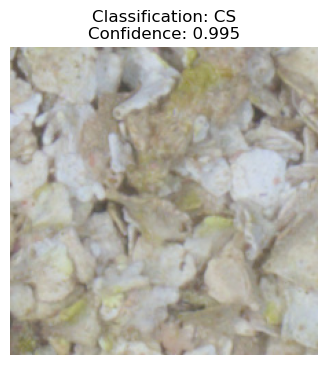

Classifying image matches:  26%|██▌       | 26/100 [00:28<01:17,  1.05s/it]

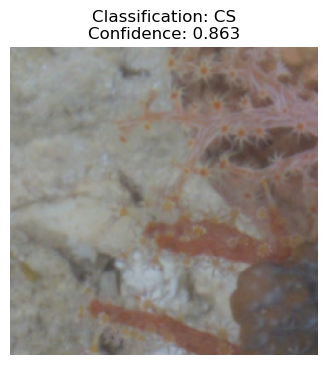

Classifying image matches:  27%|██▋       | 27/100 [00:29<01:18,  1.07s/it]

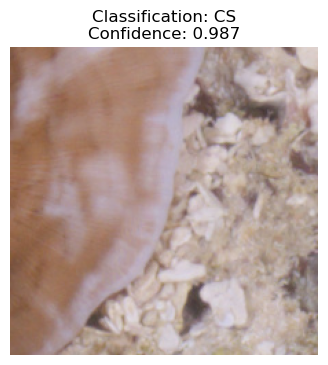

Classifying image matches:  28%|██▊       | 28/100 [00:31<01:20,  1.11s/it]

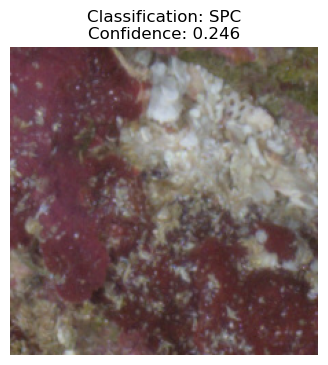

Classifying image matches:  30%|███       | 30/100 [00:32<01:00,  1.16it/s]

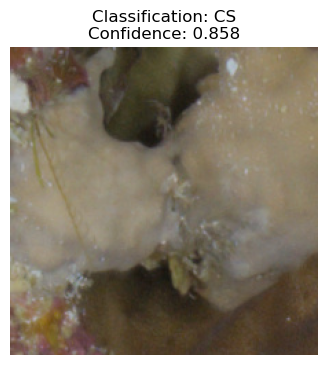

Classifying image matches:  31%|███       | 31/100 [00:33<01:15,  1.09s/it]


KeyboardInterrupt: 

In [8]:
# Classify image matches
benthic_classifier = classification.get_image_classifier("/home/pbongaerts/Downloads/reef_classifier_224.pkl")
intercepts.classify_image_matches(benthic_classifier, crop_size=224, print_summary=True)

Image match for camera 1061 at 5166, 2340
Depth: 5.928611017846443, Relevance: 0.0012194850937231937
Obstructed: False
Reprojection error: 0.003885020196339006
Reprojection coords: [  5.45999589   2.56885331 -60.80121631]


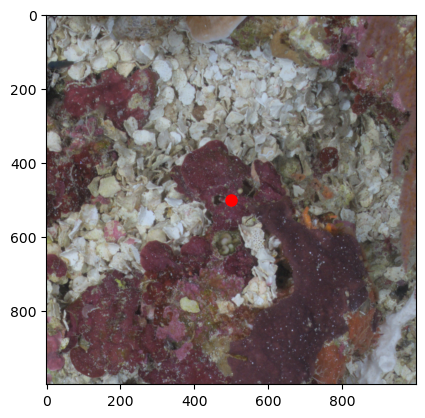

Image match for camera 753 at 4766, 3141
Depth: 5.041475721386871, Relevance: 5.3843475895656296e-05
Obstructed: False
Reprojection error: 0.0
Reprojection coords: [  5.24358379   3.44866323 -59.86520095]


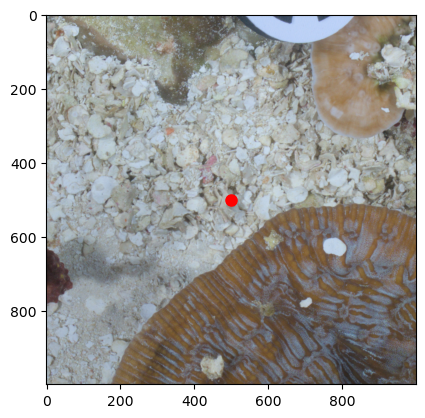

Image match for camera 437 at 6726, 3071
Depth: 6.259117624463131, Relevance: 0.00238066959965516
Obstructed: False
Reprojection error: 0.0
Reprojection coords: [  5.85699171   4.18656949 -59.21198166]


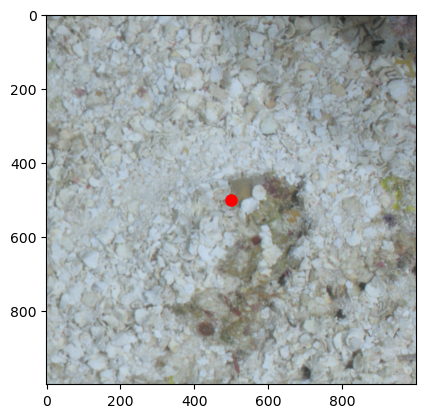

Image match for camera 438 at 624, 4890
Depth: 9.51095695602676, Relevance: 0.01987795194711261
Obstructed: True
Reprojection error: 0.24350511523665871
Reprojection coords: [  5.38612987   5.24220658 -58.11930393]


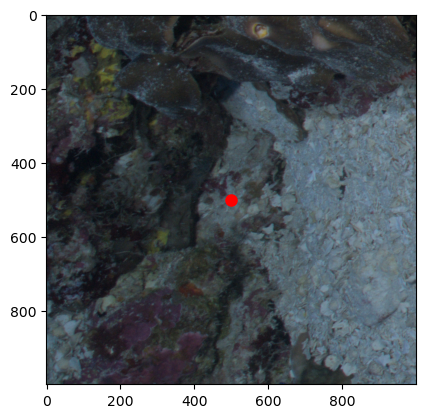

Image match for camera 1062 at 246, 4996
Depth: 5.866200454566498, Relevance: 0.008975969430569471
Obstructed: False
Reprojection error: 0.0017360129601080795
Reprojection coords: [  5.99639533   1.88025634 -61.5072256 ]


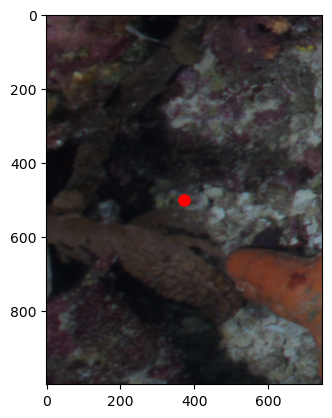

Image match for camera 746 at 4870, 3373
Depth: 4.571529453560186, Relevance: 0.00016898829194773117
Obstructed: False
Reprojection error: 0.0
Reprojection coords: [  6.3705715    3.62741176 -59.77241044]


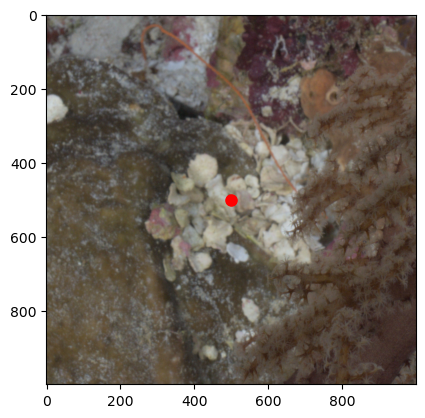

Image match for camera 439 at 6979, 3848
Depth: 6.365076491442055, Relevance: 0.0034973003544880145
Obstructed: False
Reprojection error: 0.0032749902242086263
Reprojection coords: [  6.06225815   4.28047502 -59.22958107]


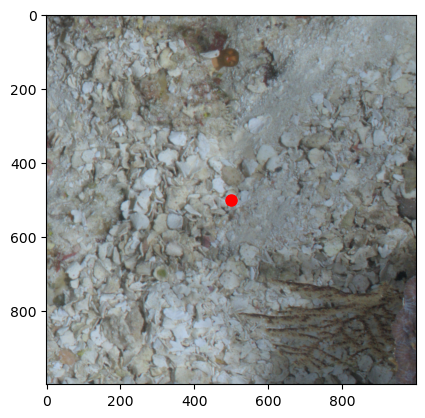

Image match for camera 440 at 126, 2696
Depth: 8.081852089608569, Relevance: 0.013101106495828654
Obstructed: True
Reprojection error: 0.14020905957176574
Reprojection coords: [  6.23227461   5.19483616 -58.07978449]


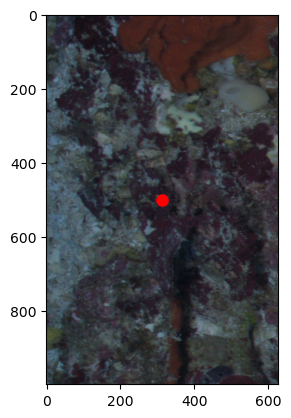

Image match for camera 777 at 6545, 3138
Depth: 6.695794121291007, Relevance: 0.0023464841686616925
Obstructed: False
Reprojection error: 0.001043931370122346
Reprojection coords: [  7.44662065   2.49109396 -61.31487445]


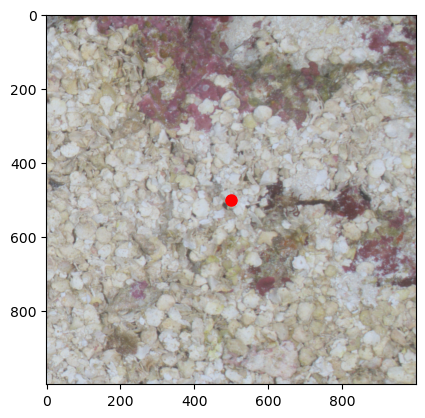

Image match for camera 1123 at 4993, 5738
Depth: 5.320423127255085, Relevance: 0.002476547022368399
Obstructed: False
Reprojection error: 0.0057503788242454865
Reprojection coords: [  6.91849528   3.76161901 -59.95593583]


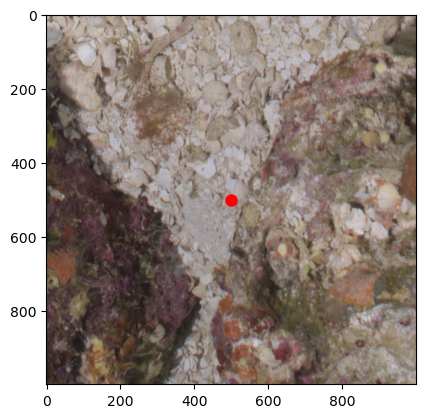

Image match for camera 1121 at 4152, 3347
Depth: 5.934485393112032, Relevance: 0.0007821775220172229
Obstructed: False
Reprojection error: 0.008249889921241853
Reprojection coords: [  6.96564554   3.92055435 -59.83335613]


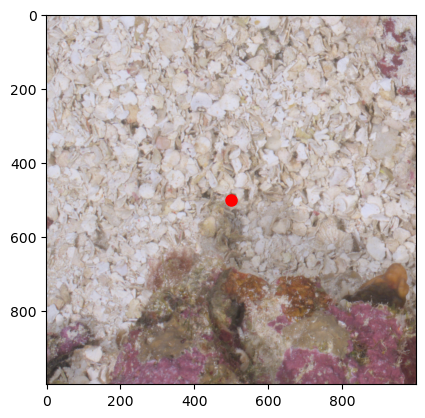

Image match for camera 450 at 130, 3077
Depth: 6.689561342355974, Relevance: 0.008404676975890646
Obstructed: True
Reprojection error: 0.018157355351289182
Reprojection coords: [  7.57085858   5.41410773 -58.31467413]


KeyboardInterrupt: 

In [5]:
for intercept in intercepts:
    intercept.image_match.show()